Synchronisationszyklus: 1000, Zeit seit Start: 4 s
Quelle 1 (time 4s):


Quelle 2 (time 4s):


Quelle 3 (time 4s):


Quelle 4 (time 4s):


Quelle 5 (time 4s):


Quelle 6 (time 4s):


Quelle 7 (time 4s):


Quelle 8 (time 4s):


Quelle 9 (time 4s):


Quelle 10 (time 4s):


Kombinierte progressive Beats (alle Segmente):


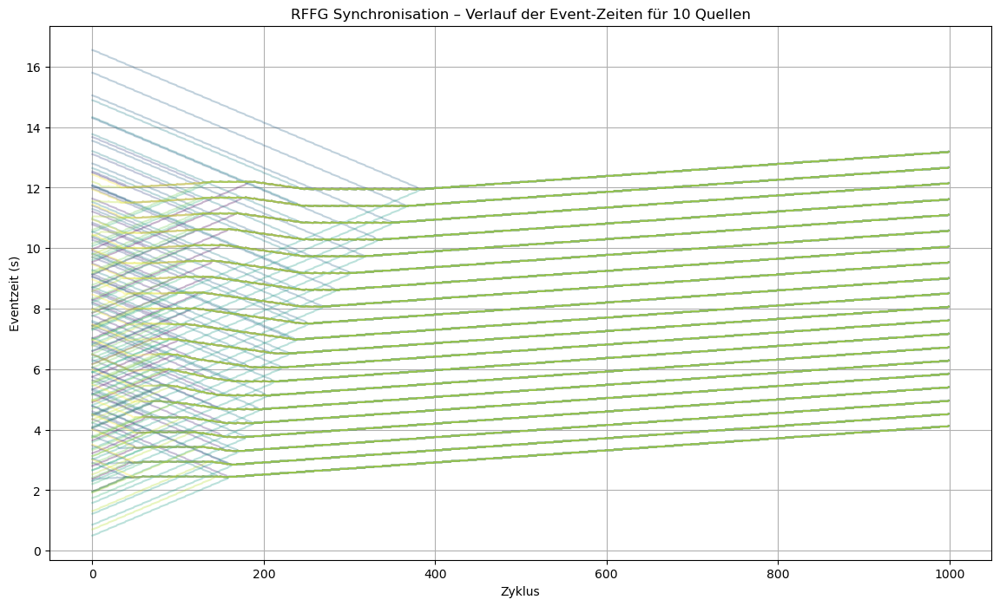

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from IPython.display import Audio, display, clear_output
import time

# Parameter
num_sources = 10
num_beats = 20
max_seconds_start_offset = 4
lock_window = 0.05
step_size = 0.01
max_cycles = 1000
oscillation_threshold = 10
segment_interval_sec = 1  # Wie oft speichern (Sekunden)

# Statistische Verteilung von BPMs (z.B. Normalverteilung 120±30, begrenzt 80-180)
bpms = np.clip(np.random.normal(loc=120, scale=30, size=num_sources), 80, 180)

# Statistische Verteilung der Startoffsets (z.B. Gleichverteilt 0 - max_seconds)
start_offsets = np.random.uniform(0, max_seconds_start_offset, size=num_sources)

# Statistische Verteilung der Frequenzen für Töne (z.B. 400-1000 Hz)
freqs = np.random.uniform(400, 1000, size=num_sources)

# Event-Zeitreihen mit Startoffset und Beatdauer
events_list = []
for s, bpm in enumerate(bpms):
    beat_duration = 60 / bpm
    events = np.cumsum(np.ones(num_beats) * beat_duration) + start_offsets[s]
    events_list.append(events.copy())

events_adj = [events.copy() for events in events_list]

# Konfikt-Zähler für Oszillationen
conflict_counters = np.zeros((num_sources, num_beats))

sample_rate = 44100

def generate_beep(freq=440, duration=0.1, sample_rate=44100):
    t = np.linspace(0, duration, int(sample_rate * duration), False)
    tone = 0.5 * np.sin(2 * np.pi * freq * t)
    audio = tone * (2**15 - 1) / np.max(np.abs(tone))
    return audio.astype(np.int16)

beeps = [generate_beep(freq=f) for f in freqs]

def create_wav(filename, events, beep, sample_rate=44100):
    total_duration = events[-1] + 1
    audio = np.zeros(int(total_duration * sample_rate), dtype=np.int16)
    beep_length = len(beep)
    for e in events:
        idx = int(e * sample_rate)
        if 0 <= idx < len(audio) - beep_length:
            audio[idx:idx+beep_length] += beep
    audio = np.clip(audio, -32768, 32767)
    wavfile.write(filename, sample_rate, audio)

def create_combined_wav(filename, list_events_list, beep_list, segment_times, sample_rate=44100):
    max_duration = 0
    for e_list, seg_time in zip(list_events_list, segment_times):
        if len(e_list) > 0:
            max_event_time = max([events[-1] for events in e_list])
            max_dur = max_event_time + 1 + seg_time
            if max_dur > max_duration:
                max_duration = max_dur
    audio = np.zeros(int(max_duration * sample_rate), dtype=np.int16)

    for seg_idx, (seg_events_list, seg_time) in enumerate(zip(list_events_list, segment_times)):
        for s, events in enumerate(seg_events_list):
            beep = beep_list[s]
            beep_length = len(beep)
            for e in events:
                idx = int((e + seg_time) * sample_rate)
                if 0 <= idx < len(audio) - beep_length:
                    audio[idx:idx+beep_length] += beep
    audio = np.clip(audio, -32768, 32767)
    wavfile.write(filename, sample_rate, audio)


def toggle(value, original, consensus):
    if value > consensus:
        return value - step_size * 2
    else:
        return value + step_size * 2

history = [[] for _ in range(num_sources)]
saved_segments = []

start_time_wall = time.time()
last_saved_time = start_time_wall

# Für progressive kombinierte Datei speichern
progressive_events_per_segment = []

for cycle in range(1, max_cycles+1):
    consensus = np.mean(np.array(events_adj), axis=0)
    
    for s in range(num_sources):
        for i in range(num_beats):
            diff = events_adj[s][i] - consensus[i]

            if abs(diff) <= lock_window:
                events_adj[s][i] = consensus[i]
            else:
                if diff > lock_window:
                    events_adj[s][i] -= step_size
                elif diff < -lock_window:
                    events_adj[s][i] += step_size

            diff_others = np.array([events_adj[j][i] for j in range(num_sources) if j != s])
            if np.any(np.abs(diff - diff_others) > 2 * lock_window):
                conflict_counters[s][i] += 1
                if conflict_counters[s][i] >= oscillation_threshold:
                    events_adj[s][i] = toggle(events_adj[s][i], events_list[s][i], consensus[i])
                    conflict_counters[s][i] = 0
            else:
                conflict_counters[s][i] = 0

        history[s].append(events_adj[s].copy())

    # Alle ~1 Sekunde speichern und progressive Daten ablegen
    current_time = time.time()
    if current_time - last_saved_time >= segment_interval_sec or cycle == max_cycles:
        last_saved_time = current_time
        timestamp = int(current_time - start_time_wall)
        clear_output(wait=True)
        print(f"Synchronisationszyklus: {cycle}, Zeit seit Start: {timestamp} s")

        # Einzeldateien pro Quelle speichern und abspielen
        for s in range(num_sources):
            wav_name = f"beats_source{s+1}_t{timestamp}s.wav"
            create_wav(wav_name, events_adj[s], beeps[s], sample_rate)
            print(f"Quelle {s+1} (time {timestamp}s):")
            display(Audio(wav_name))

        # Für den progressiven kombinierten Track abspeichern (kopierte Events bis jetzt)
        current_events_snapshot = [events_adj[s].copy() for s in range(num_sources)]
        progressive_events_per_segment.append(current_events_snapshot)

        # Segmentzeiten als Offset für Einzel-Dateien im kombinierten Track
        segment_times = [i * segment_interval_sec for i in range(len(progressive_events_per_segment))]

        # Kombinierte Datei erzeugen, die alle bisherigen Segmente direkt hintereinander legt
        combined_name = "beats_combined_progressive.wav"
        create_combined_wav(combined_name, progressive_events_per_segment, beeps, segment_times, sample_rate)
        print("Kombinierte progressive Beats (alle Segmente):")
        display(Audio(combined_name))

# Visualisierung am Ende
plt.figure(figsize=(14, 8))
colors = plt.cm.viridis(np.linspace(0, 1, num_sources))
for s in range(num_sources):
    data = np.array(history[s])
    for i in range(num_beats):
        plt.plot(data[:, i], color=colors[s], alpha=0.3)
plt.title("RFFG Synchronisation – Verlauf der Event-Zeiten für 10 Quellen")
plt.xlabel("Zyklus")
plt.ylabel("Eventzeit (s)")
plt.grid(True)
plt.show()
